In [12]:
import numpy as np
import plotly
import plotly.express as px
import tensorflow as tf
from tensorflow.keras.layers import Dense
from beaker_kmer_generator import KmerGenerator as kmer_generator


In [59]:
k_to_test = [9, 11, 21]
dims_to_test = [8, 16, 32, 64, 128, 256]

In [69]:
ks = list()
dims = list()
corr = list()

# Seed is set to not be 42 (training data) not 1010 (validation data)
seed = 3442741063749352641

def gen(k):
    kg = kmer_generator()
    kg.set_threads(2)
    kg.set_k(k)
    kg.set_seed(seed)
    kg.start()
    while True:
        data = kg.generate_pairs()
        for i in data:
            (k1a, k2a, score) = i

            #if np.sum(np.reshape(np.asarray(k1a), (k, 5))[:, 4]) > 2:
            #    next
            #if np.sum(np.reshape(np.asarray(k2a), (k, 5))[:, 4]) > 2:
            #    next

            yield (k1a, k2a, score)

for k in k_to_test:
    for embedding_dims in dims_to_test:
        weights = np.load("weights/wide_singlelayer_k{}_23Apr2023_linear_nucleotide_model_magic_dims_{}_epochs_256.npy".format(k, embedding_dims), allow_pickle=True)
        
        # For comparisons
        window_size = 1
        magic = Dense(embedding_dims, 
                    activation=tf.nn.swish, 
                    name="Magic", 
                    use_bias=False, 
                    trainable=False,
                    dtype=tf.float32)

        magic.build((window_size,k*5))
        magic.set_weights([weights[0]])

        kgen = gen(k)

        def calc_magic_score(k1, k2):
            out = magic(np.asarray([k1, k2]))
            return np.sum(abs(out[0] - out[1]))

        y_true = list()
        y = list()

        for _ in range(100000):
            (k1, k2, score) = next(kgen)
            y.append(calc_magic_score(k1, k2))
            y_true.append(score)

        ks.append(k)
        dims.append(embedding_dims)
        corr.append(np.corrcoef(y_true, y)[0][1])
        print(k, embedding_dims, np.corrcoef(y_true, y)[0][1])

9 8 0.8173974844136206
9 16 0.9223416764716207
9 32 0.9490219598665413
9 64 0.950550755253176
9 128 0.9477471313843945
9 256 0.943875751644087
11 8 0.8210592566812556
11 16 0.9151771769534957
11 32 0.9492995895214993
11 64 0.9542955328454131
11 128 0.9524673996626913
11 256 0.9466173798457471
21 8 0.752504821581192
21 16 0.8674082981451784
21 32 0.9369220766537077
21 64 0.9531990493783823
21 128 0.954007396231311
21 256 0.949713349265318


In [72]:
import pandas as pd

In [76]:
df = pd.DataFrame({'k': ks, 'dims': dims, 'correlations': corr})

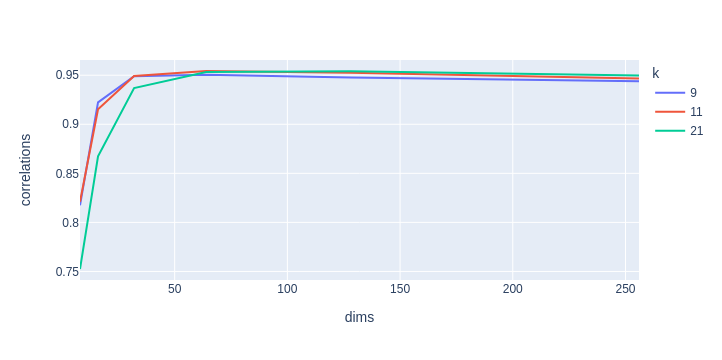

In [81]:
px.line(df, x="dims", y="correlations", color="k")

In [54]:
kgen = gen()
(k1, k2, score) = next(kgen)

In [55]:
calc_magic_score(k1, k2)

5.900503

array([[1.        , 0.93690884],
       [0.93690884, 1.        ]])

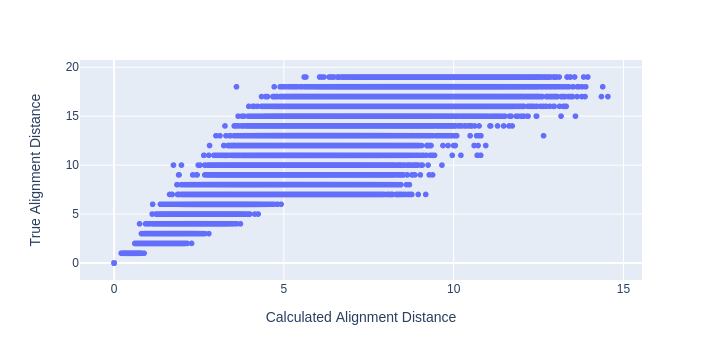

In [57]:
fig = px.scatter(y=y_true, x=y, 
           labels={
                     "y": "True Alignment Distance",
                     "x": "Calculated Alignment Distance",
                 },)

#fig.write_image("alignment_vs_calculated.png", width=800, height=400)

fig

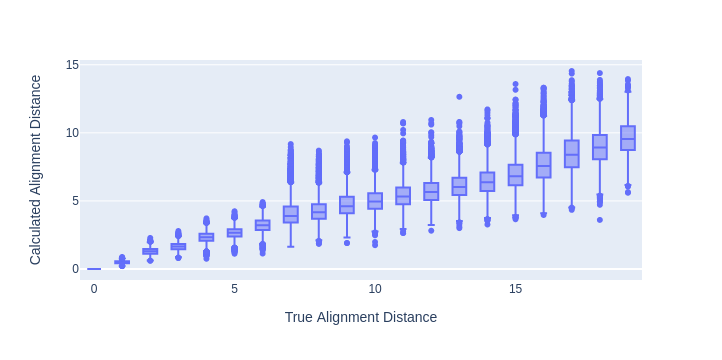

In [58]:
fig = px.box(x=y_true, y=y, 
           labels={
                     "x": "True Alignment Distance",
                     "y": "Calculated Alignment Distance",
                 },)

#fig.write_image("alignment_vs_calculated.png", width=800, height=400)

fig